# Compare with to without amp selfcal

This notebook probably should not be re-run; the paths are fragile as this is part of a data-checking/exploration step.

In [3]:
ls -d /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/*finaliter*

/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0/
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.pbcor.fits
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt1/
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal6_finaliter.model.tt0/
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid__

In [32]:
noisedir = "/orange/adamginsburg/ALMA_IMF/reduction/reduction/noise_estimation_regions/"

In [33]:
ls $noisedir

G008.67_B3_noise_sampling.reg  G338.93_B6_noise_sampling.reg
G008.67_B6_noise_sampling.reg  G351.77_B3_noise_sampling.reg
G010.62_B3_noise_sampling.reg  G351.77_B6_noise_sampling.reg
G010.62_B6_noise_sampling.reg  G353.41_B3_noise_sampling.reg
G012.80_B3_noise_sampling.reg  G353.41_B6_noise_sampling.reg
G012.80_B6_noise_sampling.reg  W43-MM1_B3_noise_sampling.reg
G327.29_B3_noise_sampling.reg  W43-MM2_B3_noise_sampling.reg
G327.29_B6_noise_sampling.reg  W43-MM2_B6_noise_sampling.reg
G328.25_B3_noise_sampling.reg  W43-MM3_B3_noise_sampling.reg
G328.25_B6_noise_sampling.reg  W43-MM3_B6_noise_sampling.reg
G333.60_B3_noise_sampling.reg  W51-E_B3_noise_sampling.reg
G333.60_B6_noise_sampling.reg  W51-E_B6_noise_sampling.reg
G337.92_B3_noise_sampling.reg  W51-IRS2_B3_noise_sampling.reg
G337.92_B6_noise_sampling.reg  W51-IRS2_B6_noise_sampling.reg
G338.93_B3_noise_sampling.reg


In [4]:
from spectral_cube import SpectralCube

In [15]:
import warnings
import spectral_cube
warnings.simplefilter('ignore', spectral_cube.utils.BeamWarning)
warnings.simplefilter('ignore', spectral_cube.utils.StokesWarning)
warnings.simplefilter('ignore', spectral_cube.utils.PossiblySlowWarning)
warnings.simplefilter('ignore', spectral_cube.utils.WCSWarning)

In [5]:
noamp = SpectralCube.read('/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits')
withamp = SpectralCube.read('/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.fits')

In [36]:
%matplotlib inline
import numpy as np
from astropy import units as u
import pylab as pl
pl.rcParams['figure.figsize'] = (16,8)
pl.style.use('dark_background')
pl.rcParams['image.origin'] = 'lower'
import sys
import glob
sys.path.append('/orange/adamginsburg/ALMA_IMF/reduction/reduction/')
sys.path.append('/orange/adamginsburg/ALMA_IMF/reduction/analysis/')
import imp, diagnostic_images
imp.reload(diagnostic_images)
from diagnostic_images import load_images, show
from spectral_cube import SpectralCube
import spectral_cube
from astropy.visualization import simple_norm
import regions

In [112]:
def compare_withamp_withoutamp(withamp, withoutamp, noisereg, zoom=slice(None), max_percent=99.9, min_percent=None, stretch='asinh',
                               noise_threshold=3):
    noamp = SpectralCube.read(withoutamp)
    withamp = SpectralCube.read(withamp)
    
    reg = regions.read_ds9(noisereg)
    
    noise_noamp = noamp.subcube_from_regions(reg).mad_std()
    noise_withamp = withamp.subcube_from_regions(reg).mad_std()
    print(f"Noise w/o: {noise_noamp:0.6g}")
    print(f"Noise with: {noise_withamp:0.6g}")
    print(f"Fractional difference: {(noise_noamp-noise_withamp)/noise_noamp}")
    
    mask = (noamp > noise_noamp*noise_threshold) & (withamp > noise_withamp*noise_threshold)
    ratio = (noamp/withamp).with_mask(mask)
    print(f"Flux ratio (no amp / with amp) 25%: {ratio.percentile(25)}  50%: {ratio.median()}  75%: {ratio.percentile(75)}")
    
    fig,((ax1,ax2),(ax3,ax4)) = pl.subplots(2,2, figsize=(12,12))
    norm = simple_norm(noamp[0].value[zoom], max_percent=max_percent, min_percent=min_percent, stretch=stretch)
    ax1.imshow(noamp[0].value[zoom], norm=norm)
    ax1.set_title("No amp selfcal")
    ax2.imshow(withamp[0].value[zoom], norm=norm)
    ax2.set_title("With amp selfcal")
    diff = (noamp[0].value-withamp[0].value)[zoom]
    ax3.imshow(diff, norm=simple_norm(diff, min_percent=1, max_percent=99, stretch='asinh'))
    ax3.set_title("No amp - With amp")
    ax4.imshow(diff,)# norm=norm)
    ax4.set_title("No amp - With amp")
    for ax in (ax1,ax2,ax3,ax4):
        ax.set_xticks([])
        ax.set_yticks([])
    
    return noamp, withamp, ratio

Noise w/o: 9.03011e-05 Jy / beam
Noise with: 6.09291e-05 Jy / beam
Fractional difference: 0.32526708824830824
Flux ratio (no amp / with amp) 25%: 0.9703435003757477  50%: 1.0131360292434692  75%: 1.1160318851470947


(SpectralCube with shape=(1, 2688, 2688) and unit=Jy / beam:
  n_x:   2688  type_x: RA---SIN  unit_x: deg    range:   272.592385 deg:  272.647969 deg
  n_y:   2688  type_y: DEC--SIN  unit_y: deg    range:   -19.956214 deg:  -19.903967 deg
  n_s:      1  type_s: FREQ      unit_s: Hz     range: 98600680647.220 Hz:98600680647.220 Hz,
 SpectralCube with shape=(1, 2688, 2688) and unit=Jy / beam:
  n_x:   2688  type_x: RA---SIN  unit_x: deg    range:   272.592385 deg:  272.647969 deg
  n_y:   2688  type_y: DEC--SIN  unit_y: deg    range:   -19.956214 deg:  -19.903967 deg
  n_s:      1  type_s: FREQ      unit_s: Hz     range: 98600680647.220 Hz:98600680647.220 Hz,
 SpectralCube with shape=(1, 2688, 2688):
  n_x:   2688  type_x: RA---SIN  unit_x: deg    range:   272.592385 deg:  272.647969 deg
  n_y:   2688  type_y: DEC--SIN  unit_y: deg    range:   -19.956214 deg:  -19.903967 deg
  n_s:      1  type_s: FREQ      unit_s: Hz     range: 98600680647.220 Hz:98600680647.220 Hz)

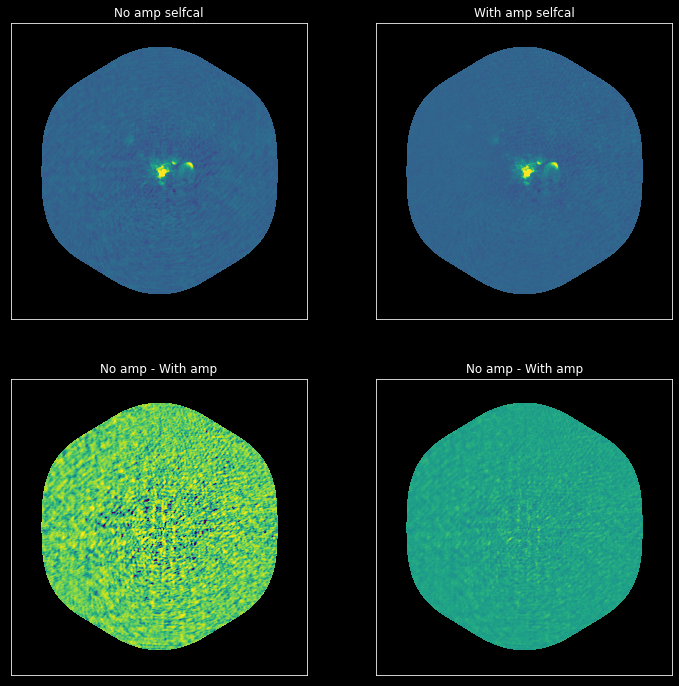

In [192]:
compare_withamp_withoutamp(withamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.fits',
                           withoutamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits',
                           noisereg=f"{noisedir}/G010.62_B3_noise_sampling.reg",
                          )

Noise w/o: 9.03011e-05 Jy / beam
Noise with: 6.09291e-05 Jy / beam
Fractional difference: 0.32526708824830824
Flux ratio (no amp / with amp) 25%: 0.9703435003757477  50%: 1.0131360292434692  75%: 1.1160318851470947


(SpectralCube with shape=(1, 2688, 2688) and unit=Jy / beam:
  n_x:   2688  type_x: RA---SIN  unit_x: deg    range:   272.592385 deg:  272.647969 deg
  n_y:   2688  type_y: DEC--SIN  unit_y: deg    range:   -19.956214 deg:  -19.903967 deg
  n_s:      1  type_s: FREQ      unit_s: Hz     range: 98600680647.220 Hz:98600680647.220 Hz,
 SpectralCube with shape=(1, 2688, 2688) and unit=Jy / beam:
  n_x:   2688  type_x: RA---SIN  unit_x: deg    range:   272.592385 deg:  272.647969 deg
  n_y:   2688  type_y: DEC--SIN  unit_y: deg    range:   -19.956214 deg:  -19.903967 deg
  n_s:      1  type_s: FREQ      unit_s: Hz     range: 98600680647.220 Hz:98600680647.220 Hz,
 SpectralCube with shape=(1, 2688, 2688):
  n_x:   2688  type_x: RA---SIN  unit_x: deg    range:   272.592385 deg:  272.647969 deg
  n_y:   2688  type_y: DEC--SIN  unit_y: deg    range:   -19.956214 deg:  -19.903967 deg
  n_s:      1  type_s: FREQ      unit_s: Hz     range: 98600680647.220 Hz:98600680647.220 Hz)

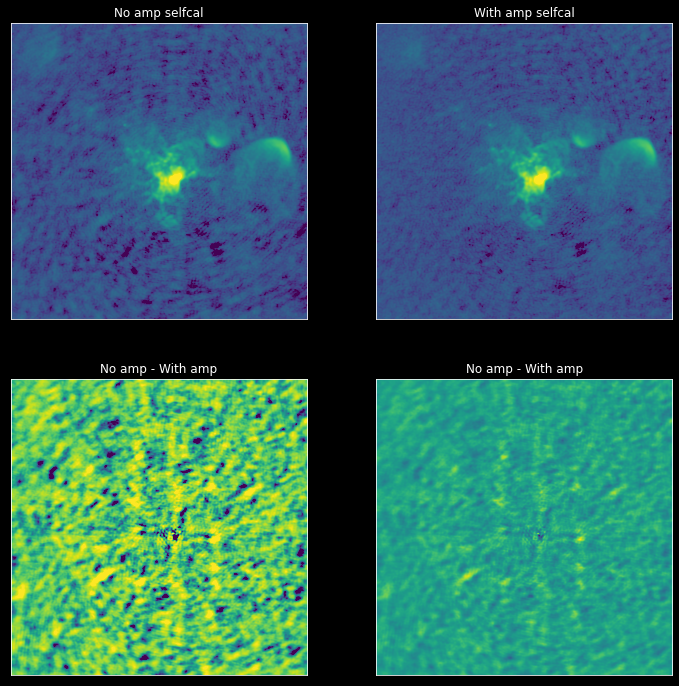

In [193]:
compare_withamp_withoutamp(withamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.fits',
                           withoutamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/cleanest/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits',
                           noisereg=f"{noisedir}/G010.62_B3_noise_sampling.reg",
                           zoom=(slice(1000,-1000), slice(1000,-1000)),
                           max_percent=99.9,
                           stretch='log',
                           min_percent=1)

In [87]:
ls -d /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/bsens/*finaliter*

/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/bsens/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_bsens_12M_robust0_selfcal6_finaliter.image.tt0/
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/bsens/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_bsens_12M_robust0_selfcal6_finaliter.image.tt0.fits
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/bsens/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_bsens_12M_robust0_selfcal6_finaliter.image.tt0.pbcor.fits
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/bsens/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_bsens_12M_robust0_selfcal6_finaliter.image.tt1/
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/bsens/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_bsens_12M_robust0_selfcal6_finaliter.model.tt0/
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/bsens/G010

Noise w/o: 9.06492e-05 Jy / beam
Noise with: 6.10569e-05 Jy / beam
Fractional difference: 0.3264478093202156
Flux ratio (no amp / with amp) 25%: 0.9697402715682983  50%: 1.0144838094711304  75%: 1.119202733039856


(SpectralCube with shape=(1, 2688, 2688) and unit=Jy / beam:
  n_x:   2688  type_x: RA---SIN  unit_x: deg    range:   272.592385 deg:  272.647969 deg
  n_y:   2688  type_y: DEC--SIN  unit_y: deg    range:   -19.956214 deg:  -19.903967 deg
  n_s:      1  type_s: FREQ      unit_s: Hz     range: 98600680647.220 Hz:98600680647.220 Hz,
 SpectralCube with shape=(1, 2688, 2688) and unit=Jy / beam:
  n_x:   2688  type_x: RA---SIN  unit_x: deg    range:   272.592385 deg:  272.647969 deg
  n_y:   2688  type_y: DEC--SIN  unit_y: deg    range:   -19.956214 deg:  -19.903967 deg
  n_s:      1  type_s: FREQ      unit_s: Hz     range: 98600680647.220 Hz:98600680647.220 Hz,
 SpectralCube with shape=(1, 2688, 2688):
  n_x:   2688  type_x: RA---SIN  unit_x: deg    range:   272.592385 deg:  272.647969 deg
  n_y:   2688  type_y: DEC--SIN  unit_y: deg    range:   -19.956214 deg:  -19.903967 deg
  n_s:      1  type_s: FREQ      unit_s: Hz     range: 98600680647.220 Hz:98600680647.220 Hz)

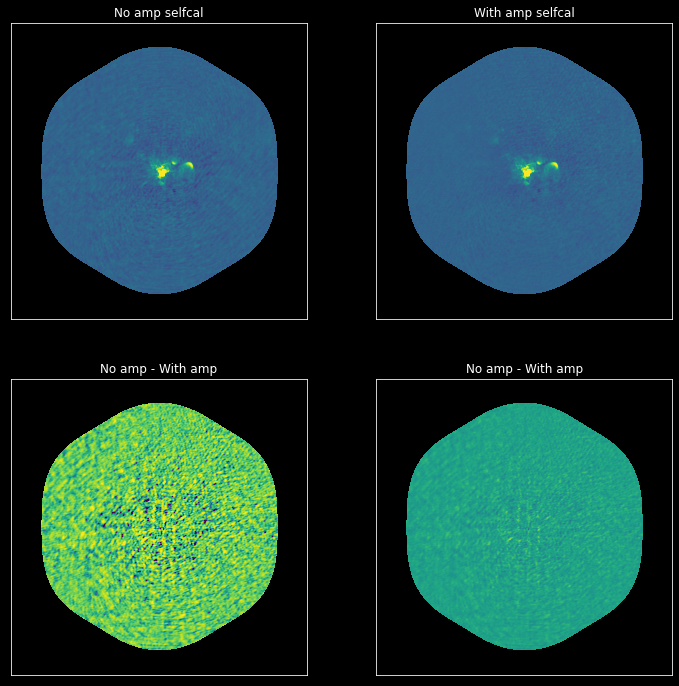

In [194]:
compare_withamp_withoutamp(withamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/bsens/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_bsens_12M_robust0_selfcal7_finaliter.image.tt0.fits',
                           withoutamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B3/bsens/G010.62_B3_uid___A001_X1296_X1e5_continuum_merged_bsens_12M_robust0_selfcal6_finaliter.image.tt0.fits',
                           noisereg=f"{noisedir}/G010.62_B3_noise_sampling.reg"
                          )

In [89]:
ls -d /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/cleanest/*finaliter*

/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/cleanest/G010.62_B6_uid___A001_X1296_X1db_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0/
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/cleanest/G010.62_B6_uid___A001_X1296_X1db_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.fits
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/cleanest/G010.62_B6_uid___A001_X1296_X1db_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.pbcor.fits
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/cleanest/G010.62_B6_uid___A001_X1296_X1db_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt1/
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/cleanest/G010.62_B6_uid___A001_X1296_X1db_continuum_merged_12M_robust0_selfcal4_finaliter.mask/
/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/cleanest/G010.62_B6_uid___A001

In [90]:
(8.34-7.60)/7.60

0.09736842105263162

Noise w/o: 7.60595e-05 Jy / beam
Noise with: 8.34627e-05 Jy / beam
Fractional difference: -0.09733441595279967
Flux ratio (no amp / with amp) 25%: 0.8572733551263809  50%: 0.9969056844711304  75%: 1.0813367366790771


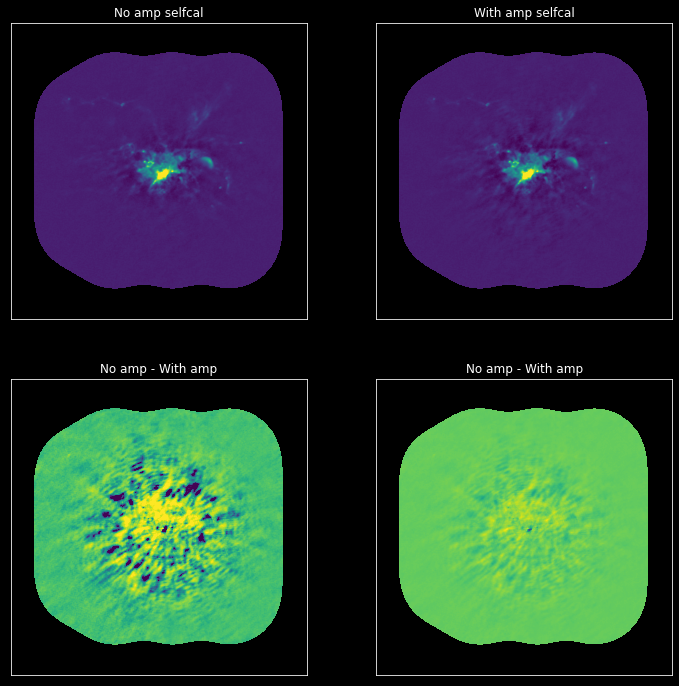

In [91]:
compare_withamp_withoutamp(withamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/cleanest/G010.62_B6_uid___A001_X1296_X1db_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.fits',
                           withoutamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/cleanest/G010.62_B6_uid___A001_X1296_X1db_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits',
                           noisereg=f"{noisedir}/G010.62_B6_noise_sampling.reg"
                          )

Noise w/o: 7.3379e-05 Jy / beam
Noise with: 7.99216e-05 Jy / beam
Fractional difference: -0.08916198541790765
Flux ratio (no amp / with amp) 25%: 0.82907634973526  50%: 0.9770434498786926  75%: 1.0642473697662354


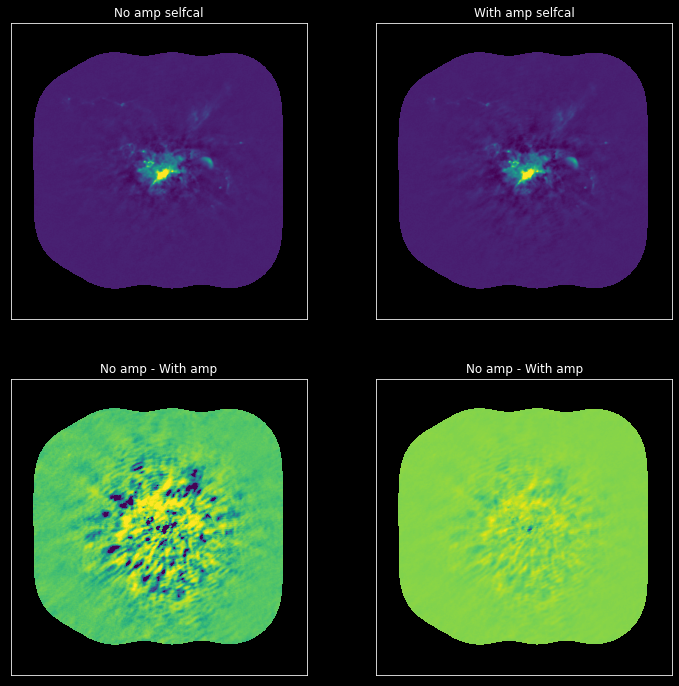

In [92]:
compare_withamp_withoutamp(withamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/bsens/G010.62_B6_uid___A001_X1296_X1db_continuum_merged_bsens_12M_robust0_selfcal4_finaliter.image.tt0.fits',
                           withoutamp='/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G010.62/B6/bsens/G010.62_B6_uid___A001_X1296_X1db_continuum_merged_bsens_12M_robust0_selfcal5_finaliter.image.tt0.fits',
                           noisereg=f"{noisedir}/G010.62_B6_noise_sampling.reg"
                          )

In [93]:
reldir = "/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release"

In [94]:
ls $reldir/G333.60/B3/cleanest/

G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0/
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.fits
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.pbcor.fits
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.image.tt1/
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.model.tt0/
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.model.tt1/
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt0/
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt1/
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.residual.tt0/
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_dirty_preselfcal.residual.tt1/
G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_preselfcal_finalmodel.

Noise w/o: 0.000111795 Jy / beam
Noise with: 9.32624e-05 Jy / beam
Fractional difference: 0.16577215077502616
Flux ratio (no amp / with amp) 25%: 0.9476364701986313  50%: 0.9763473272323608  75%: 1.052456647157669


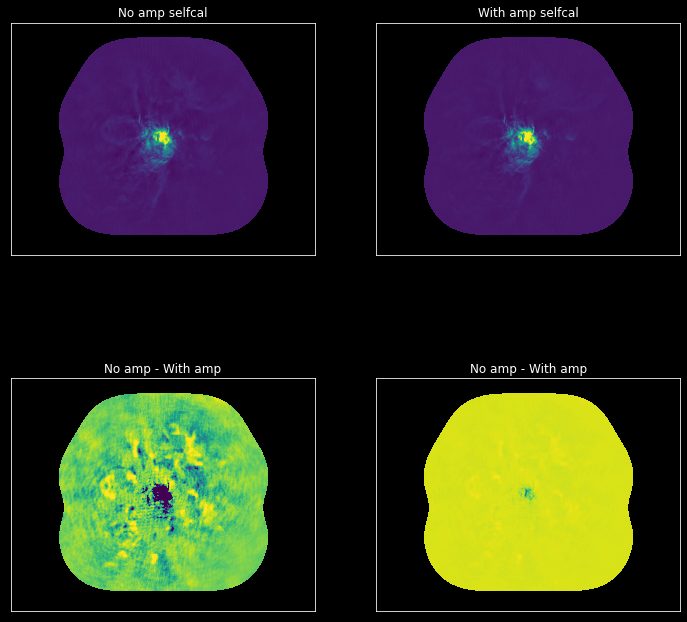

In [111]:
compare_withamp_withoutamp(withamp=f"{reldir}/G333.60/B3/cleanest/G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
                           withoutamp=f"{reldir}/G333.60/B3/cleanest/G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.fits",
                           noisereg=f"{noisedir}/G333.60_B3_noise_sampling.reg"
                          )

Noise w/o: 0.000111795 Jy / beam
Noise with: 9.32624e-05 Jy / beam
Fractional difference: 0.16577215077502616
Flux ratio (no amp / with amp) 25%: 0.9504146128892899  50%: 0.9959446787834167  75%: 1.195065975189209


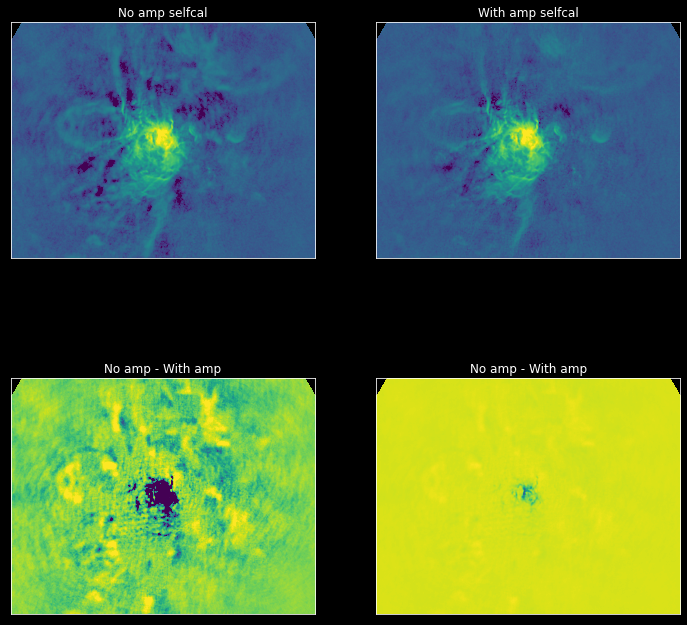

In [96]:
compare_withamp_withoutamp(withamp=f"{reldir}/G333.60/B3/cleanest/G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
                           withoutamp=f"{reldir}/G333.60/B3/cleanest/G333.60_B3_uid___A001_X1296_X1a3_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.fits",
                           noisereg=f"{noisedir}/G333.60_B3_noise_sampling.reg",
                           zoom=(slice(600,-600), slice(800,-800)),
                           max_percent=99.9,
                           stretch='log',
                           min_percent=1)

In [97]:
ls $reldir/G333.60/B6/cleanest/

G333.60_B6_dirty_robust0_12M_mask.mask/
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0/
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.fits
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.pbcor.fits
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.image.tt1/
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.model.tt0/
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.model.tt1/
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt0/
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt1/
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.residual.tt0/
G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_dirty_preselfcal.residual.tt1/
G333.60_B6_uid___A001_X1296_X19b_continuum_m

Noise w/o: 0.000116673 Jy / beam
Noise with: 0.000118247 Jy / beam
Fractional difference: -0.013483740912687947
Flux ratio (no amp / with amp) 25%: 0.8636691570281982  50%: 0.9357735514640808  75%: 0.9917966723442078


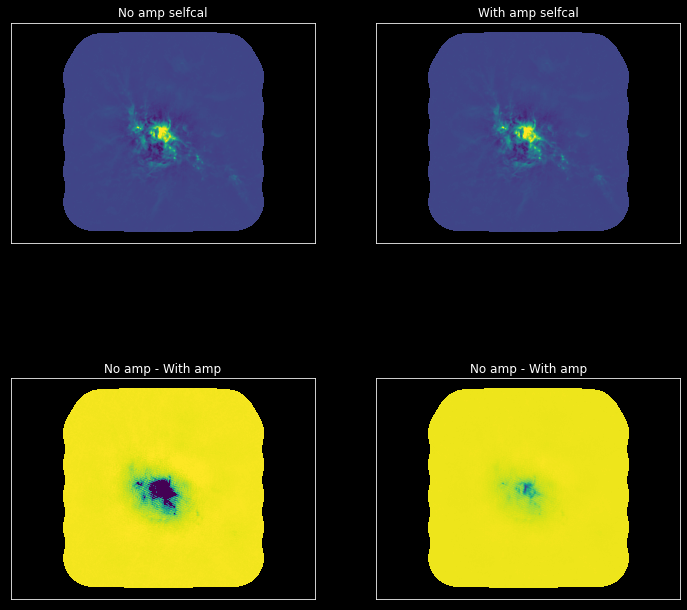

In [98]:
compare_withamp_withoutamp(withamp=f"{reldir}/G333.60/B6/cleanest/G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
                           withoutamp=f"{reldir}/G333.60/B6/cleanest/G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.fits",
                           noisereg=f"{noisedir}/G333.60_B6_noise_sampling.reg",
                           #zoom=(slice(600,-600), slice(800,-800)),
                           #max_percent=99.9,
                           #stretch='log',
                           #min_percent=1
                          )

Noise w/o: 0.000116673 Jy / beam
Noise with: 0.000118247 Jy / beam
Fractional difference: -0.013483740912687947
Flux ratio (no amp / with amp) 25%: 0.8636691570281982  50%: 0.9357735514640808  75%: 0.9917966723442078


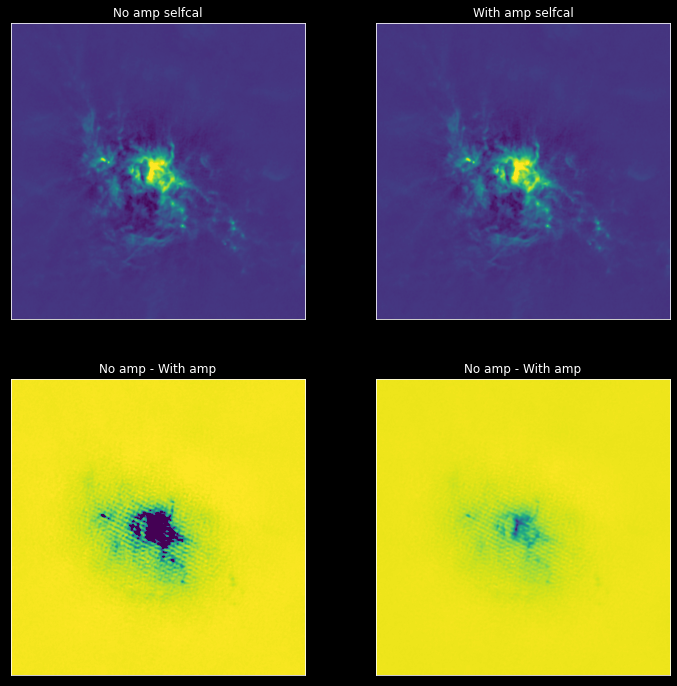

In [99]:
compare_withamp_withoutamp(withamp=f"{reldir}/G333.60/B6/cleanest/G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
                           withoutamp=f"{reldir}/G333.60/B6/cleanest/G333.60_B6_uid___A001_X1296_X19b_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.fits",
                           noisereg=f"{noisedir}/G333.60_B6_noise_sampling.reg",
                           zoom=(slice(300,-300), slice(600,-600)),
                           #max_percent=99.9,
                           #stretch='log',
                           #min_percent=0
                          )

For these next few, tracking down the right versions is trickier.

    \item G353.41 B3
    \item W43-MM3 B3
    \item W51-E B3
    \item W51-IRS2 B6
    \item G353.41 B6
    \item G12.80 B3 (had amp-only selfcal)
    \item G12.80 B6 (had amp-only selfcal)
    \item G338.93 B3

In [100]:
ls -lhrt $reldir/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits

-rw-r--r-- 1 adamginsburg adamginsburg 3.7M Dec 18 15:16 /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits


In [101]:
ls -lhrt /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/October2020Release/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits

-rw-r--r-- 1 adamginsburg adamginsburg 3.7M Dec 18 15:16 /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/October2020Release/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits


In [102]:
ls -lhrt $reldir/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits

-rw-r--r-- 1 adamginsburg adamginsburg 3.7M Dec 18 15:16 /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits


In [103]:
ls -lhrt /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/October2020Release/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits

-rw-r--r-- 1 adamginsburg adamginsburg 3.7M Dec 18 15:16 /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/October2020Release/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits


In [104]:
ls -lhrtL /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/RestructuredImagingResults/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits

-rw-r--r-- 1 adamginsburg adamginsburg 3.7M Feb  2 09:34 /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/RestructuredImagingResults/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits


In [105]:
rstimresdir = "/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/RestructuredImagingResults"

Noise w/o: 0.000187392 Jy / beam
Noise with: 0.000175808 Jy / beam
Fractional difference: 0.06181731288872736
Flux ratio (no amp / with amp) 25%: 0.9783959835767746  50%: 1.006681203842163  75%: 1.036973088979721


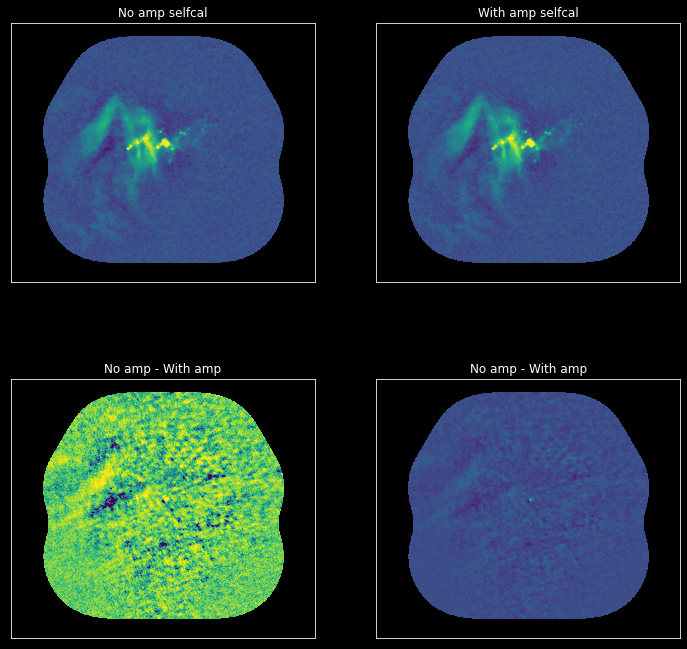

In [106]:
compare_withamp_withoutamp(withamp=f"{reldir}/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits",
                           withoutamp=f"{rstimresdir}/G353.41/B3/cleanest/G353.41_B3_uid___A001_X1296_X1d5_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits",
                           noisereg=f"{noisedir}/G353.41_B3_noise_sampling.reg",
                           #zoom=(slice(300,-300), slice(600,-600)),
                           #max_percent=99.9,
                           #stretch='log',
                           #min_percent=0
                          )

In [107]:
ls -lhrt $reldir/G353.41/B6/cleanest/

total 28M
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 27 20:27 G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_preselfcal.mask/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 28 19:59 G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 28 19:59 G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt0/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 28 19:59 G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_dirty_preselfcal.model.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 28 19:59 G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_dirty_preselfcal.model.tt0/
drwxr-xr-x 4 adamginsburg adamginsburg 4.0K Nov 28 20:00 G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_dirty_preselfcal.residual.tt1/
drwxr-xr-x 4 adamginsburg adamginsburg 4.0K Nov 28 20:00 G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_d

Noise w/o: 0.000418046 Jy / beam
Noise with: 0.00040756 Jy / beam
Fractional difference: 0.025083554045378327
Flux ratio (no amp / with amp) 25%: 0.9832575172185898  50%: 1.0248221158981323  75%: 1.0594328045845032


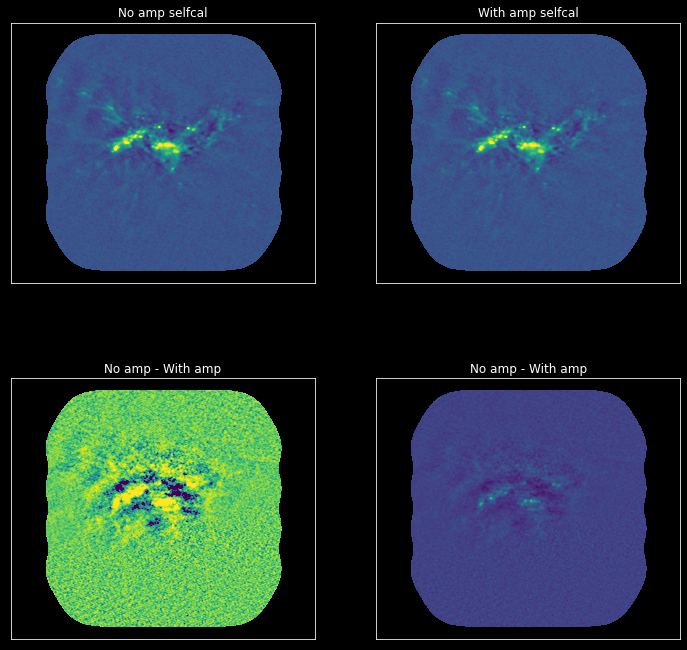

In [108]:
compare_withamp_withoutamp(withamp=f"{reldir}/G353.41/B6/cleanest/G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits",
                           withoutamp=f"{rstimresdir}/G353.41/B6/cleanest/G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits",
                           noisereg=f"{noisedir}/G353.41_B6_noise_sampling.reg",
                           #zoom=(slice(300,-300), slice(600,-600)),
                           #max_percent=99.9,
                           #stretch='log',
                           #min_percent=0
                          )

Noise w/o: 0.000418046 Jy / beam
Noise with: 0.00040756 Jy / beam
Fractional difference: 0.025083554045378327
Flux ratio (no amp / with amp) 25%: 0.9928570836782455  50%: 1.0246727466583252  75%: 1.049389809370041


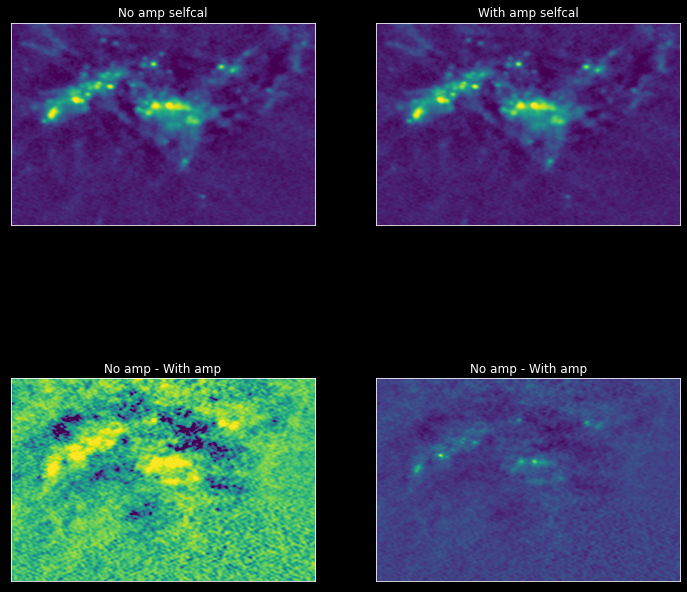

In [113]:
noamp, withamp, ratio = compare_withamp_withoutamp(withamp=f"{reldir}/G353.41/B6/cleanest/G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits",
                           withoutamp=f"{rstimresdir}/G353.41/B6/cleanest/G353.41_B6_uid___A001_X1296_X1c9_continuum_merged_12M_robust0_selfcal6_finaliter.image.tt0.fits",
                           noisereg=f"{noisedir}/G353.41_B6_noise_sampling.reg",
                           zoom=(slice(300,-300), slice(300,-300)),
                           max_percent=99.9,
                           #stretch='log',
                           min_percent=1,
                          )

In [130]:
ls -d $reldir

/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/


In [129]:
ls -lhrt $reldir/W43-MM3/B3/cleanest

total 366M
-rw-r--r-- 1 adamginsburg adamginsburg  39M Nov  7 16:19 W43-MM3_B3_uid___A001_X1296_X12f_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.fits
-rw-r--r-- 1 adamginsburg adamginsburg  39M Nov  7 16:19 W43-MM3_B3_uid___A001_X1296_X12f_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.pbcor.fits
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 13 20:26 W43-MM3_B3_uid___A001_X1296_X12f_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 13 20:26 W43-MM3_B3_uid___A001_X1296_X12f_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt0/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 13 20:26 W43-MM3_B3_uid___A001_X1296_X12f_continuum_merged_12M_robust0_dirty_preselfcal.model.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 13 20:26 W43-MM3_B3_uid___A001_X1296_X12f_continuum_merged_12M_robust0_dirty_preselfcal.model.tt0/
drwxr-xr-x 4 adamginsburg adamginsburg 4.0K Nov 13 20:30 W43-MM3_B3_uid___A001_X1296_X12f_continu

Noise w/o: 3.17187e-05 Jy / beam
Noise with: 3.6066e-05 Jy / beam
Fractional difference: -0.1370563269882817
Flux ratio (no amp / with amp) 25%: 0.8016194850206375  50%: 0.841981053352356  75%: 0.8994201570749283


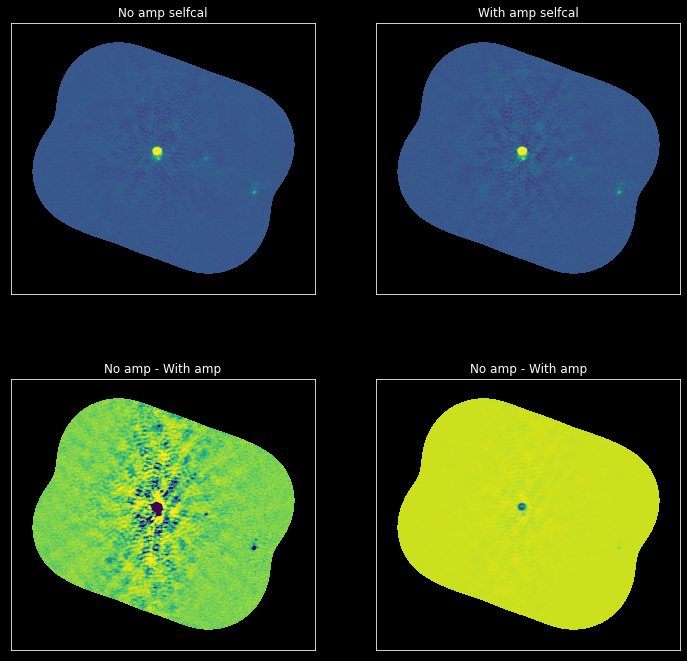

In [135]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/W43-MM3/B3/cleanest/W43-MM3_B3_uid___A001_X1296_X12f_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/W43-MM3/B3/cleanest/W43-MM3_B3_uid___A001_X1296_X12f_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
    noisereg=f"{noisedir}/W43-MM3_B3_noise_sampling.reg",
    #zoom=(slice(300,-300), slice(300,-300)),
    #max_percent=99.9,
    #stretch='log',
    #min_percent=1,
)

In [136]:
ls -lhrt $reldir/G012.80/B3/cleanest

total 34M
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Sep 25  2019 G012.80_B3_dirty_robust0_12M_mask.mask/
-rw-r--r-- 1 adamginsburg adamginsburg 3.6M Nov  7 16:26 G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.fits
-rw-r--r-- 1 adamginsburg adamginsburg 3.6M Nov  7 16:26 G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.pbcor.fits
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 08:45 G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt0/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 08:45 G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 08:46 G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_12M_robust0_dirty_preselfcal.model.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 08:46 G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_12M_robust0_dirty_preselfcal.model.tt0/
d

Noise w/o: 0.000427359 Jy / beam
Noise with: 0.000229293 Jy / beam
Fractional difference: 0.463464927089282
Flux ratio (no amp / with amp) 25%: 0.9528006017208099  50%: 1.0024625062942505  75%: 1.0908747911453247


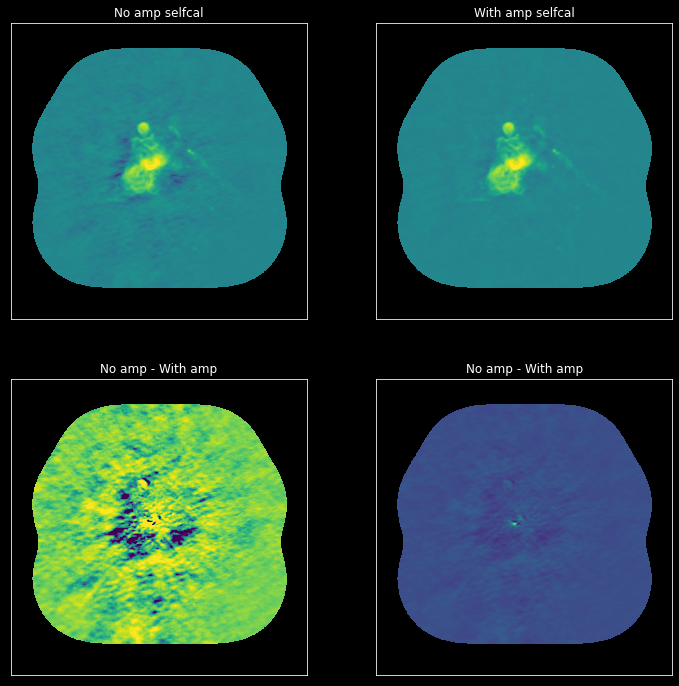

In [195]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/G012.80/B3/cleanest/G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/G012.80/B3/cleanest/G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/G012.80_B3_noise_sampling.reg",
    #zoom=(slice(300,-300), slice(300,-300)),
    #max_percent=99.9,
    stretch='log',
    #min_percent=1,
)

Noise w/o: 0.00041885 Jy / beam
Noise with: 0.000259363 Jy / beam
Fractional difference: 0.38077183793896346
Flux ratio (no amp / with amp) 25%: 0.9778874516487122  50%: 1.024001955986023  75%: 1.1468619108200073


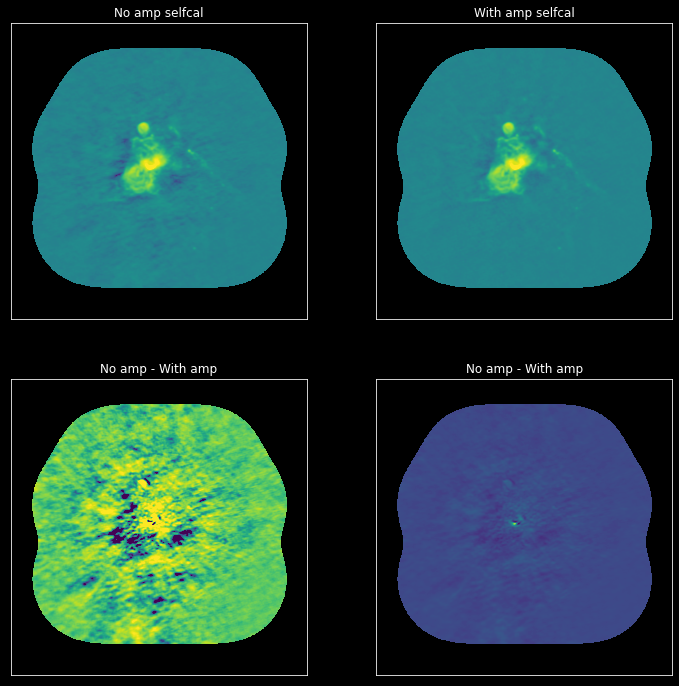

In [196]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/G012.80/B3/bsens/G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_bsens_12M_robust0_selfcal5_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/G012.80/B3/bsens/G012.80_B3_uid___A001_X1296_X1fb_continuum_merged_bsens_12M_robust0_selfcal5_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/G012.80_B3_noise_sampling.reg",
    #zoom=(slice(300,-300), slice(300,-300)),
    #max_percent=99.9,
    stretch='log',
    #min_percent=1,
)

In [138]:
ls -lhrt $reldir/G012.80/B6/cleanest

total 29M
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Sep 25  2019 G012.80_B6_dirty_robust0_12M_mask.mask/
-rw-r--r-- 1 adamginsburg adamginsburg 3.0M Nov  7 16:27 G012.80_B6_uid___A001_X1296_X1ef_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.fits
-rw-r--r-- 1 adamginsburg adamginsburg 3.0M Nov  7 16:27 G012.80_B6_uid___A001_X1296_X1ef_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.pbcor.fits
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 02:36 G012.80_B6_uid___A001_X1296_X1ef_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 02:36 G012.80_B6_uid___A001_X1296_X1ef_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt0/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 02:36 G012.80_B6_uid___A001_X1296_X1ef_continuum_merged_12M_robust0_dirty_preselfcal.model.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 02:36 G012.80_B6_uid___A001_X1296_X1ef_continuum_merged_12M_robust0_dirty_preselfcal.model.tt0/
d

Noise w/o: 0.000725506 Jy / beam
Noise with: 0.000620935 Jy / beam
Fractional difference: 0.14413554760812117
Flux ratio (no amp / with amp) 25%: 0.8855806291103363  50%: 0.9716272354125977  75%: 1.0427284836769104


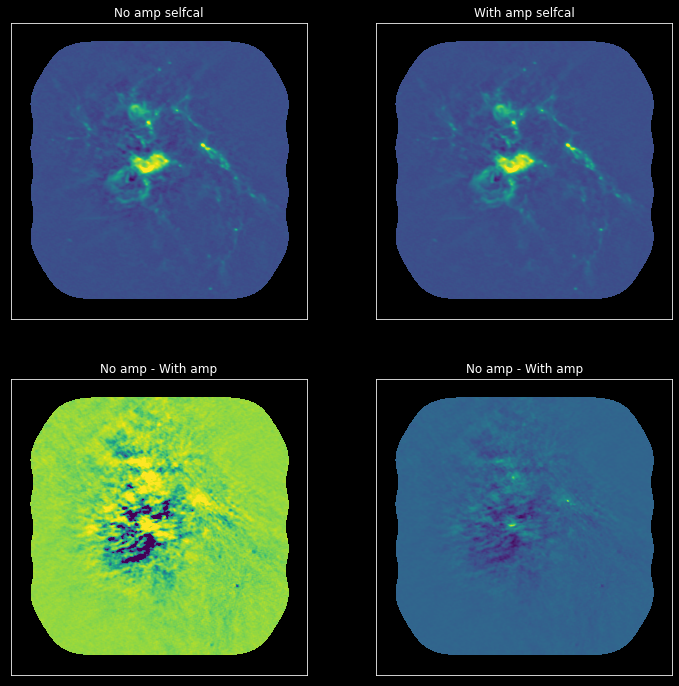

In [139]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/G012.80/B6/cleanest/G012.80_B6_uid___A001_X1296_X1ef_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/G012.80/B6/cleanest/G012.80_B6_uid___A001_X1296_X1ef_continuum_merged_12M_robust0_selfcal5_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/G012.80_B6_noise_sampling.reg",
    #zoom=(slice(300,-300), slice(300,-300)),
    #max_percent=99.9,
    #stretch='log',
    #min_percent=1,
)

In [140]:
ls -lhrt $reldir/G338.93/B3/cleanest

total 298M
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Sep 25  2019 G338.93_B3_dirty_robust0_12M_mask.mask/
-rw-r--r-- 1 adamginsburg adamginsburg  33M Oct 26 20:37 G338.93_B3_uid___A001_X1296_X159_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.fits
-rw-r--r-- 1 adamginsburg adamginsburg  33M Oct 26 20:37 G338.93_B3_uid___A001_X1296_X159_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.pbcor.fits
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 27 17:00 G338.93_B3_uid___A001_X1296_X159_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt0/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 27 17:00 G338.93_B3_uid___A001_X1296_X159_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 27 17:00 G338.93_B3_uid___A001_X1296_X159_continuum_merged_12M_robust0_dirty_preselfcal.model.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 27 17:00 G338.93_B3_uid___A001_X1296_X159_continuum_merged_12M_robust0_dirty_preselfcal.model.tt0/


Noise w/o: 7.14329e-05 Jy / beam
Noise with: 7.14987e-05 Jy / beam
Fractional difference: -0.0009211844408323254
Flux ratio (no amp / with amp) 25%: 0.9933229088783264  50%: 1.00015389919281  75%: 1.0075212121009827


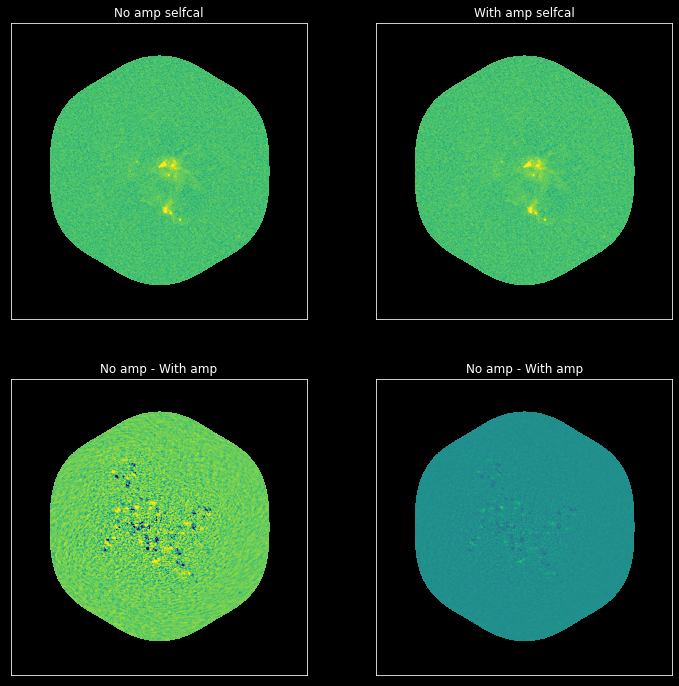

In [141]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/G338.93/B3/cleanest/G338.93_B3_uid___A001_X1296_X159_continuum_merged_12M_robust0_selfcal3_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/G338.93/B3/cleanest/G338.93_B3_uid___A001_X1296_X159_continuum_merged_12M_robust0_selfcal3_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/G338.93_B3_noise_sampling.reg",
    #zoom=(slice(300,-300), slice(300,-300)),
    #max_percent=99.9,
    #stretch='log',
    #min_percent=1,
)

In [142]:
ls -lhrt $reldir/W51-E/B3/cleanest

total 660M
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 16 21:25 W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 16 21:25 W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt0/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 16 21:25 W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_dirty_preselfcal.model.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 16 21:25 W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_dirty_preselfcal.model.tt0/
drwxr-xr-x 4 adamginsburg adamginsburg 4.0K Nov 16 21:29 W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_dirty_preselfcal.residual.tt0/
drwxr-xr-x 4 adamginsburg adamginsburg 4.0K Nov 16 21:29 W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_dirty_preselfcal.residual.tt1/
drwxr-xr-x 4 adamginsburg adamginsburg 4.0K Nov 16 21:30 W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_

Noise w/o: 6.11888e-05 Jy / beam
Noise with: 6.39207e-05 Jy / beam
Fractional difference: -0.04464610366686171
Flux ratio (no amp / with amp) 25%: 0.9180314987897873  50%: 1.0038268566131592  75%: 1.1050609648227692


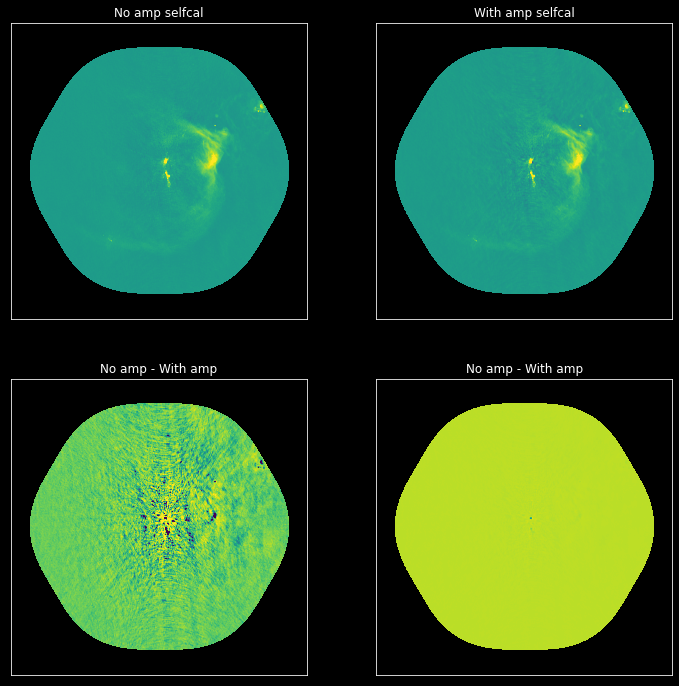

In [143]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/W51-E/B3/cleanest/W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/W51-E/B3/cleanest/W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/W51-E_B3_noise_sampling.reg",
    #zoom=(slice(300,-300), slice(300,-300)),
    #max_percent=99.9,
    #stretch='log',
    #min_percent=1,
)

Noise w/o: 6.11888e-05 Jy / beam
Noise with: 6.39207e-05 Jy / beam
Fractional difference: -0.04464610366686171
Flux ratio (no amp / with amp) 25%: 0.9180314987897873  50%: 1.0038268566131592  75%: 1.1050609648227692


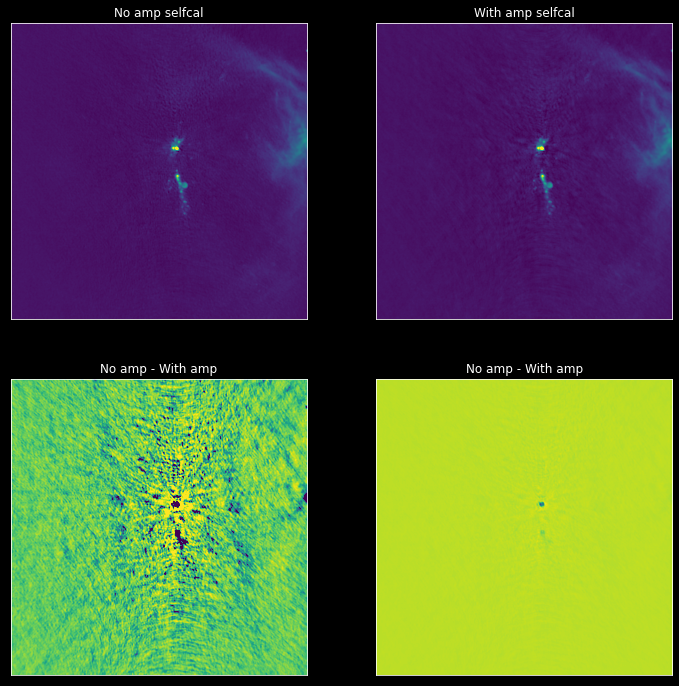

In [148]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/W51-E/B3/cleanest/W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/W51-E/B3/cleanest/W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/W51-E_B3_noise_sampling.reg",
    zoom=(slice(1500,-1500), slice(1500,-1500)),
    max_percent=99.99,
    stretch='asinh',
    min_percent=0.01,
)

In [144]:
ls -lhrt $reldir/W51-IRS2/B6/cleanest

total 46M
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Jan 26  2020 W51-IRS2_B6_dirty_robust0_12M_mask.mask/
-rw-r--r-- 1 adamginsburg adamginsburg 4.8M Nov  7 16:38 W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.fits
-rw-r--r-- 1 adamginsburg adamginsburg 4.8M Nov  7 16:38 W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_dirty_preselfcal.image.tt0.pbcor.fits
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 11:23 W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 11:23 W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_dirty_preselfcal.psf.tt0/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 11:23 W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_dirty_preselfcal.model.tt1/
drwxr-xr-x 3 adamginsburg adamginsburg 4.0K Nov 12 11:23 W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_dirty_preselfcal.model

Noise w/o: 0.000112689 Jy / beam
Noise with: 0.000104428 Jy / beam
Fractional difference: 0.0733128083226805
Flux ratio (no amp / with amp) 25%: 0.9485853016376495  50%: 0.9973582625389099  75%: 1.0540910363197327


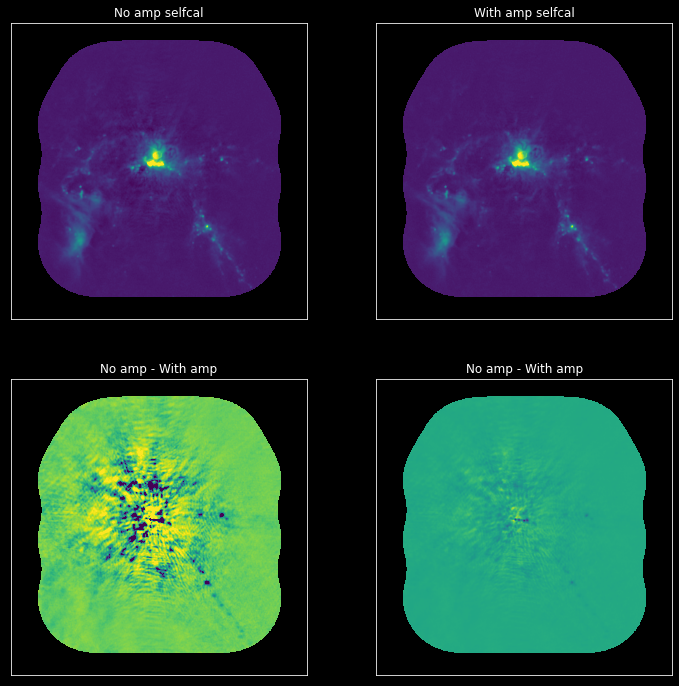

In [145]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/W51-IRS2/B6/cleanest/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/W51-IRS2/B6/cleanest/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/W51-IRS2_B6_noise_sampling.reg",
    #zoom=(slice(300,-300), slice(300,-300)),
    #max_percent=99.9,
    #stretch='log',
    #min_percent=1,
)

Noise w/o: 0.000112689 Jy / beam
Noise with: 0.000104428 Jy / beam
Fractional difference: 0.0733128083226805
Flux ratio (no amp / with amp) 25%: 0.9485853016376495  50%: 0.9973582625389099  75%: 1.0540910363197327


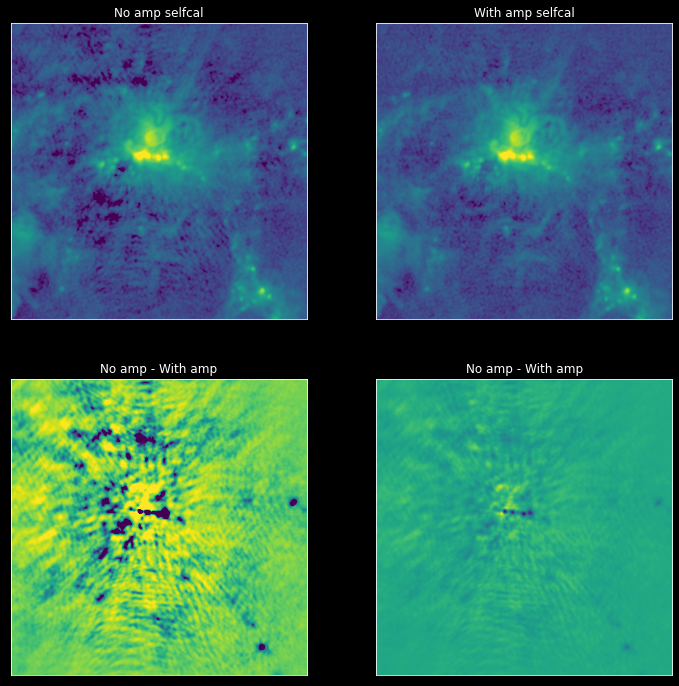

In [150]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/W51-IRS2/B6/cleanest/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/W51-IRS2/B6/cleanest/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/W51-IRS2_B6_noise_sampling.reg",
    zoom=(slice(300,-300), slice(300,-300)),
    max_percent=99.9,
    stretch='log',
    min_percent=1,
)

Noise w/o: 0.000112689 Jy / beam
Noise with: 0.000104428 Jy / beam
Fractional difference: 0.0733128083226805
Flux ratio (no amp / with amp) 25%: 0.976324200630188  50%: 1.000236988067627  75%: 1.020895004272461


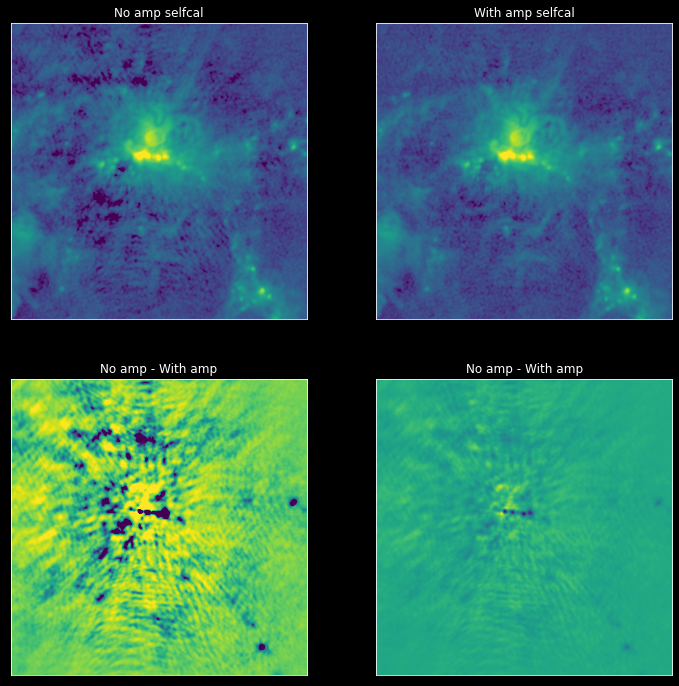

In [151]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/W51-IRS2/B6/cleanest/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/W51-IRS2/B6/cleanest/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/W51-IRS2_B6_noise_sampling.reg",
    zoom=(slice(300,-300), slice(300,-300)),
    max_percent=99.9,
    stretch='log',
    min_percent=1,
    noise_threshold=15,
)

Noise w/o: 0.000112689 Jy / beam
Noise with: 0.000104428 Jy / beam
Fractional difference: 0.0733128083226805
Flux ratio (no amp / with amp) 25%: 0.976324200630188  50%: 1.000236988067627  75%: 1.020895004272461


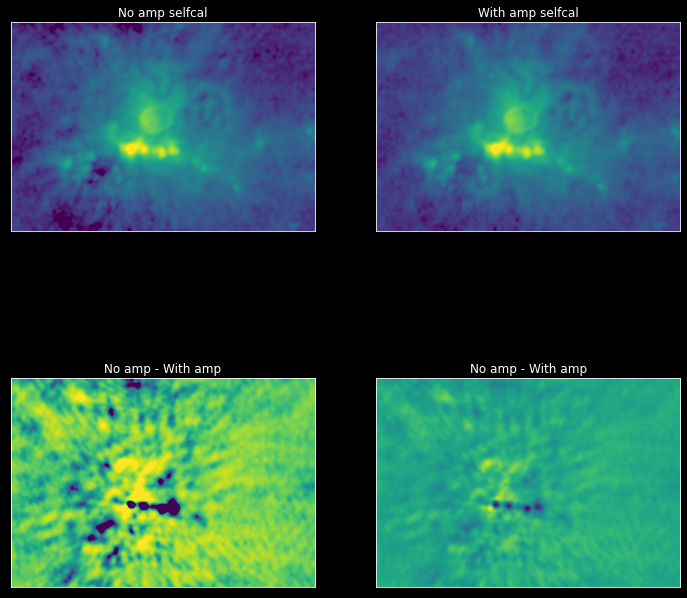

In [162]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/W51-IRS2/B6/cleanest/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/W51-IRS2/B6/cleanest/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/W51-IRS2_B6_noise_sampling.reg",
    zoom=(slice(500,-400), slice(400,-400)),
    max_percent=99.9,
    stretch='log',
    min_percent=1,
    noise_threshold=15,
)

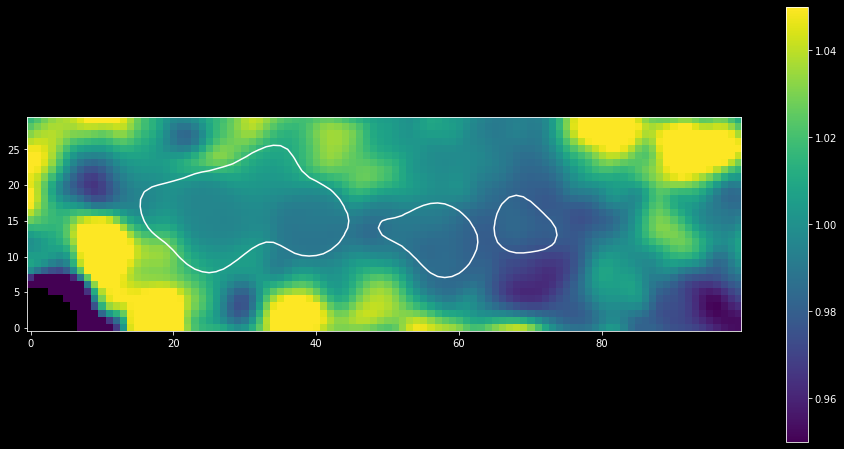

In [174]:
slc = (slice(570,600),slice(500,600))
pl.imshow(ratio[0][slc].value, vmin=0.95, vmax=1.05)
pl.colorbar()
pl.contour(noamp[0][slc].value, levels=[0.1], colors='w')

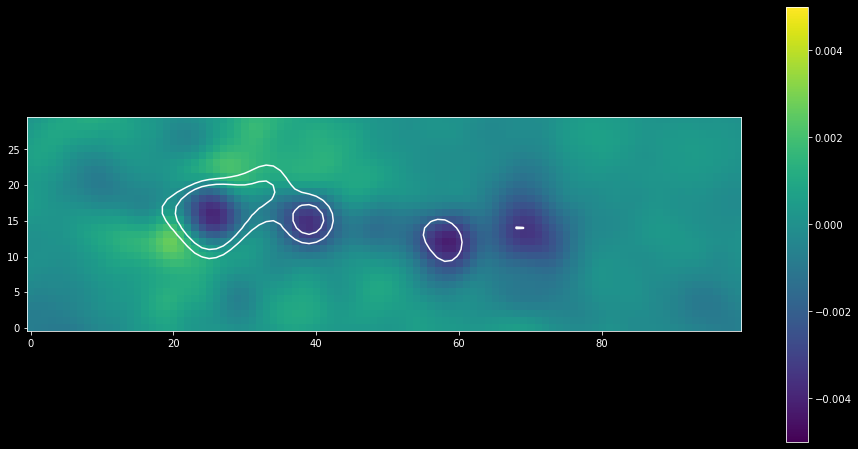

In [186]:
pl.imshow((noamp-withamp)[0][slc].value, vmin=-0.005, vmax=0.005)
pl.colorbar()
pl.contour(noamp[0][slc].value, levels=[0.2, 0.3], colors='w')

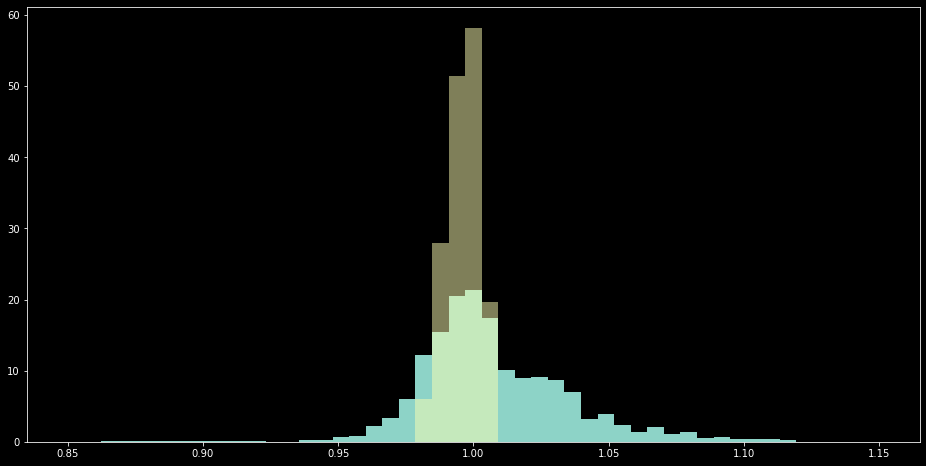

In [188]:
xx = ratio[0][slc].value
bins = np.linspace(0.85, 1.15)
_=pl.hist(xx[xx==xx], density=True, bins=bins)
_=pl.hist(xx[noamp[0][slc].value > 0.2], density=True, bins=bins, alpha=0.5)

Noise w/o: 9.36409e-05 Jy / beam
Noise with: 8.01032e-05 Jy / beam
Fractional difference: 0.14457012162037308
Flux ratio (no amp / with amp) 25%: 0.9458708614110947  50%: 0.9981484413146973  75%: 1.0714431405067444


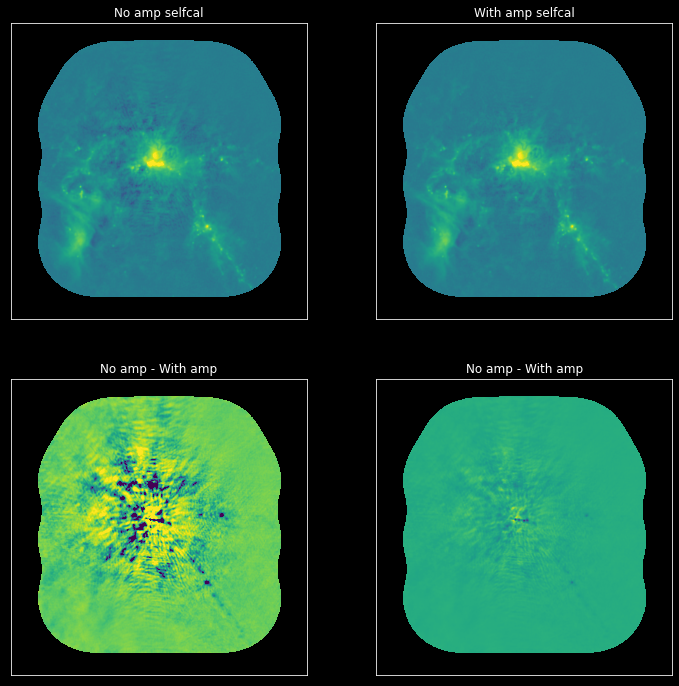

In [191]:
noamp, withamp, ratio = compare_withamp_withoutamp(
    withamp=        f"{reldir}/W51-IRS2/B6/bsens/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_bsens_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    withoutamp=f"{rstimresdir}/W51-IRS2/B6/bsens/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_bsens_12M_robust0_selfcal8_finaliter.image.tt0.fits",
    noisereg=     f"{noisedir}/W51-IRS2_B6_noise_sampling.reg",
    #zoom=(slice(500,-400), slice(400,-400)),
    max_percent=99.9,
    stretch='log',
    #min_percent=1,
    #noise_threshold=15,
)